# <span style="color:blue"> Computer Vision — Spring 2026

## Exercise 1

**Deadline:** April 15, 17:00. \
If you need more time, please send a private Piazza message letting me know that you'll submit late. An extention of up to 1 week is automatically approved.

---



In this exercise, you will practice basic image operations such as loading, saving, and displaying an image, getting familiar with NumPy, and understanding the benefits of vectorized operations in Python. The exercise contains two parts:

1. Image Convolutions.
2. Implementing a classic Harris corner Detector.

## Submission guidelines

1. Your submission should include the following files only:
   - `hw1_<ID>_<ID>.ipynb` \
     Replace \<ID\> with your ID number(s).
   - All image files used in your experiments.
3. Use Jupyter Notebook.
4. Submit this assignment in pairs (no triplets, singles ok).
   * One student should submit the homework, and the other should not submit anything.
   * If you are not the one submitting, make sure that your collaborator indeed submits!
5. **Check that your solution is properly displayed in the last cell!**

## Read the following instructions carefully

1. Write **efficient vectorized** code.
2. You are responsible for the correctness of your code and should add as many tests as you see fit.
3. Use `Python 3` and `NumPy 1.3.2` or above. Before submitting the exercise, restart the kernel and run the notebook from start to finish to make sure everything works.
4. You are allowed to use functions and methods from the [Python Standard Library](https://docs.python.org/3/library/) and [NumPy](https://www.numpy.org/devdocs/reference/) only. Any other imports are forbidden unless provided by us.
5. Your code must run without errors. **Code that fails to run will not be graded.**
6. Document your code properly.


## Honor Code
The assignment is a basic tool for learning the material. You can probably find the solution on the web, but then you will not learn anything from it.
You are more than welcome to discuss the assignment with your friends, but you are not allowed to give your code or answers and you are not allowed to use their code or answers.
Feel free to use AI, but you are expected to understand every piece of code that you submit. Please re-read the course's AI policy.
Remember — you take this course in order to learn. Also, the final exam will contain a lot of material from the assignments. 😀

### I declair that I respcet the honor code, and that I understand the course's plagiarism policy and AI policy.
<span style="color:red"> \<Mendel SETTI\>


In [23]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import convolve2d

# specify the way plots behave in jupyter notebook
%matplotlib inline
plt.rcParams['figure.figsize'] = (8.0, 8.0) # set default size of plots
plt.rcParams['image.cmap'] = 'gray'

In [24]:
import platform
print("Python version: ", platform.python_version())
print("Numpy version: ", np.__version__)

Python version:  3.12.12
Numpy version:  2.3.3


## <span style="color:blue">**Section A: Convolutions**</span>

In this part, you will need to write a function **convolvedImage = convolutionMask(img,mask)**  which gets a 2D `np.array` of a grey level image and a convolution mask (kernel) and outputs the convolved image with your mask. It also should plot  the original image and the convolved image side by side. Use captions on each image that indicate what you present. (Hint: see an example in hw0.)\
You may use the `convolve2d` function from `scipy.signal`.\
**Note:** Make sure that you understand the differences between correlation and convolution.\
Suggest a convolution mask for each of the 4 cases:
    
1. Mask1:  a convolution mask (kernel)  that computes the average of *5×5* pixels around each pixel.
   
    
2. Mask2:  a convolution mask (kernel) of size *5×5* such that the maximal
    value over all possible grey level images (range 0 to 255) will be obtained in the center of a widnow that contains a black  shape region surrounded by white pixels (see the region below).  Note, the rest of the image may contain any values.

    The shape region:
    
  $$
\begin{bmatrix}
255 & 255 & 255 & 255 & 255 \\
255 & 0 & 255 & 255 & 255 \\
255 & 0 & 0 & 0 & 255 \\
255 & 0 & 0 & 255 & 255 \\
255 & 255 & 255 & 255 & 255
\end{bmatrix}
$$

3. Let '*' be a don't care value.\
    Mask3:  a mask as defined in  2 above  but for the following region:
    
$$
\begin{bmatrix}
0 & 0 & 0 & 0 & 0 \\
0 & \ast & 255 & \ast & 0 \\
0 & 255 & 255 & 255 & 255 \\
0 & \ast & 255 & 0 & 0 \\
0 & 0 & 0 & 0 & 0
\end{bmatrix}
$$

4. Mask4: a convolution mask (kernel)  that computes a 3 pixel shift of the image to the right.\
    You can ignore the results along the border of the image.

You may add any helper functions for your implementation. **Submit your functions below**.


In [25]:
# You may add any helper functions for your implementation. Write your code in the cells below.

# For each call of the function, show on screen the result of your function.

def convolutionMask(img, mask):
    convolvedImage = convolve2d(img,mask,mode='same',boundary='symm')
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(convolvedImage, cmap='gray')
    plt.title("Convolved Image")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return convolvedImage

This cell was used to test small mask like the first and fourth mask in order to see the difference between the original and the convolved image.

(1, 7)
(250, 250)


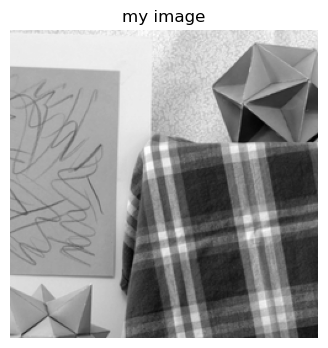

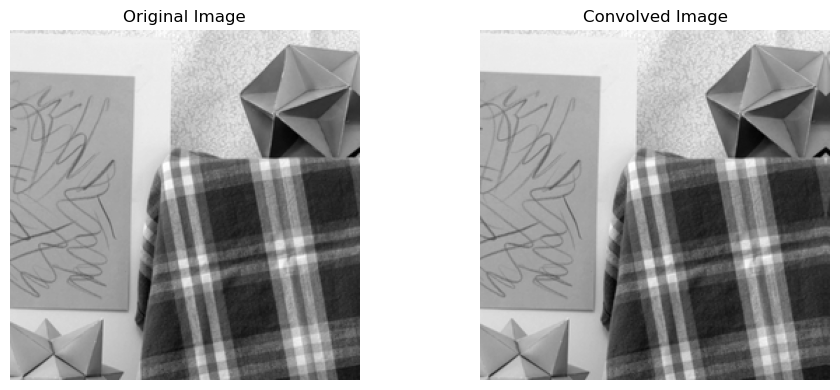

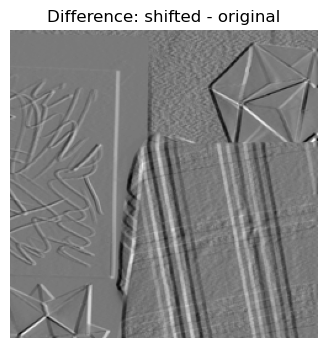

In [26]:
#mask1 = np.ones((5,5),dtype=np.float64)/25
mask = np.array([[1,0,0,0,0,0,0]])
img = cv2.imread("view6_crop.tif",cv2.IMREAD_GRAYSCALE)
print(mask.shape)
print(img.shape)
plt.figure(figsize=(6, 4))
plt.imshow(img)
plt.axis('off')
plt.title('my image')
plt.show()
x = convolutionMask(img,mask)
diff = x - img

plt.figure(figsize=(6, 4))
plt.imshow(diff, cmap='gray')
plt.title("Difference: shifted - original")
plt.axis('off')
plt.show()

In [ ]:
# Masks:
mask1 = np.ones((5,5),dtype=np.float64)/25
mask2 = np.array([
    [1,1,1,1,1],
    [1,-1,1,1,1],
    [1,-1,-1,-1,1],
    [1,-1,-1,1,1],
    [1,1,1,1,1]
])
mask3 = np.array([
    [-1,-1,-1,-1,-1],
    [-1,0,1,0,-1],
    [0,1,1,1,1],
    [-1,0,255,-1,-1],
    [-1,-1,-1,-1,-1]
])
mask4 =np.zeros((7,7))
mask4[3,0] = 1

The cell below test another implementation of the fourth mask and compares it to the implementation of mask4 that I choosed. Ultimately, we can see that both implementation are equivalent as shown by the last image ploted.

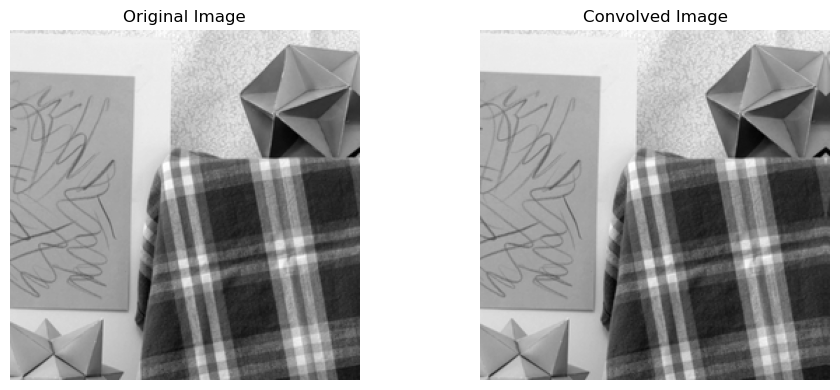

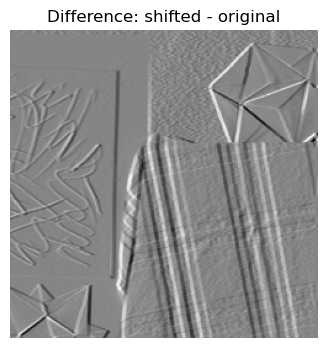

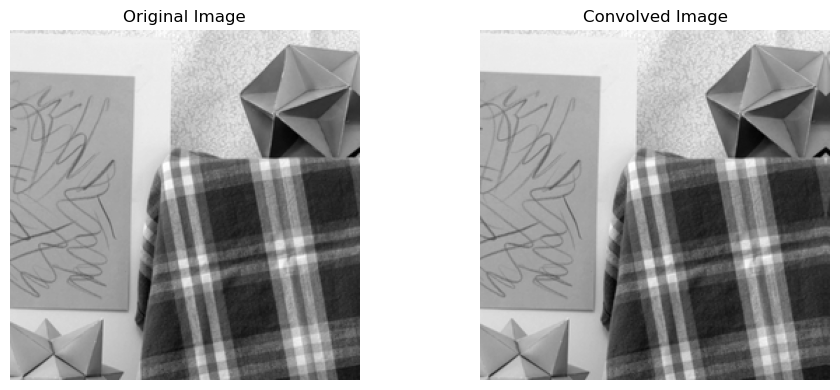

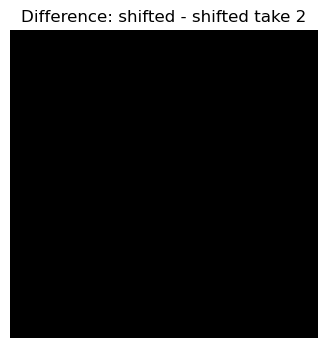

In [ ]:
x = convolutionMask(img,mask4)
diff = x - img

plt.figure(figsize=(6, 4))
plt.imshow(diff, cmap='gray')
plt.title("Difference: shifted - original")
plt.axis('off')
plt.show()

mask4_take2 = np.array([[1,0,0,0,0,0,0]])
x2 = convolutionMask(img,mask4_take2)
t_diff = x-x2
plt.figure(figsize=(6, 4))
plt.imshow(t_diff, cmap='gray')
plt.title("Difference: shifted - shifted take 2")
plt.axis('off')
plt.show()

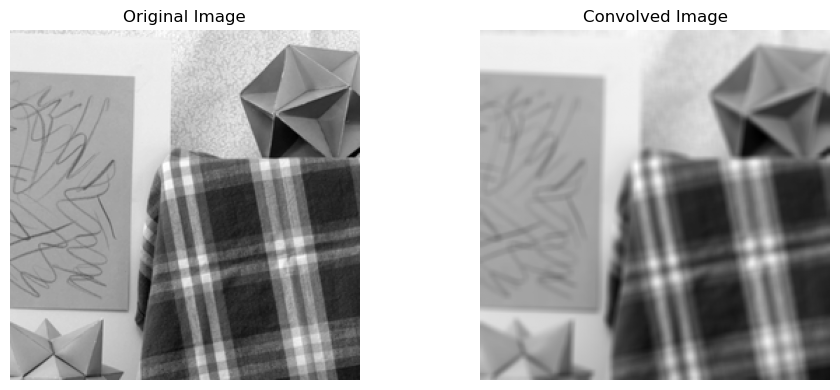

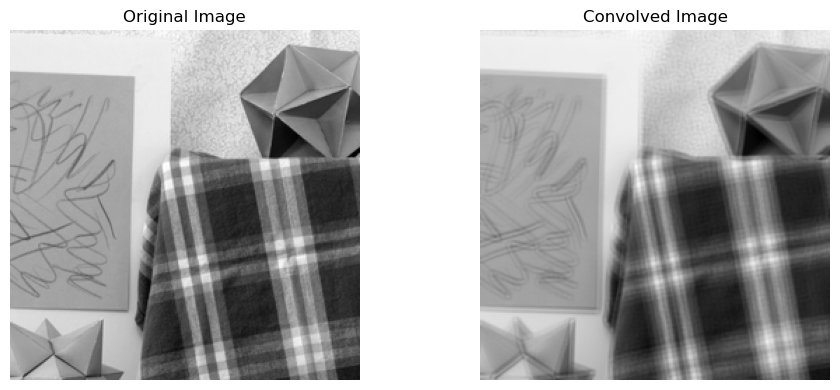

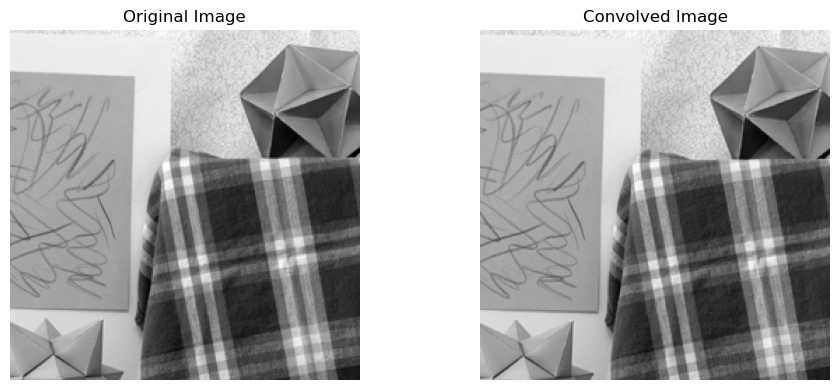

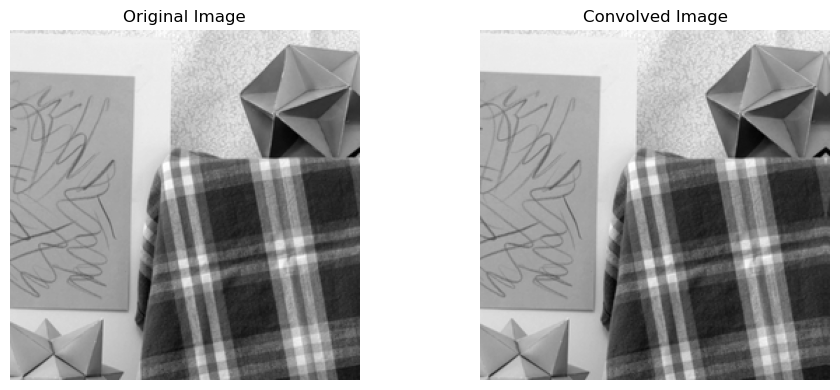

Shapes: Og:  (250, 250)  mask 1:  (250, 250)  mask 2:  (250, 250)  mask 3:  (250, 250) mask 4:  (250, 250)


In [7]:
def test_A(imageName):
    img = cv2.imread(imageName, cv2.IMREAD_GRAYSCALE)
    convolvedImage1 = convolutionMask(img, mask1)
    convolvedImage2 = convolutionMask(img, mask2)
    convolvedImage3 = convolutionMask(img, mask3)
    convolvedImage4 = convolutionMask(img, mask4)
    print("Shapes: Og: ",img.shape," mask 1: ",convolvedImage1.shape," mask 2: ",convolvedImage2.shape," mask 3: ",convolvedImage3.shape,end=' ')
    print("mask 4: ", convolvedImage4.shape)
    #plt.imshow(img - convolvedImage4)

# Uncomments the following to test. Don't forget to try various inputs and edge cases. Feel free to add your own images.
img = 'view6_crop.tif'
test_A(img)

## <span style="color:blue">**Section B: Corner Detector**</span>
    
In this section, you will implement the Harris corner detector as covered in class. Refer to the slides of the algorithm details.

Reference to the original paper: [A COMBINED CORNER AND EDGE DETECTOR, Harris \& Stephens, Alvey Vision Conference, 1988](https://bmva-archive.org.uk/bmvc/1988/avc-88-023.pdf)

You will write the function: \
`corners, plots = harris_corner(im, s_smooth, s_neighb, th, density_size, display)`.

<u>Inputs:</u> \
_im_: a grey-level image.\
_s_smooth_: parameter for the Gaussian used to calculate image derivatives.\
_s_neighb_: parameter for the Gaussian used to sum over a local window. \
_th_: threshold for corner detection. \
_density_size_: size of search area when performing non-maximum suppression. \
_display_: a binary parameter; if True, debug and output images are displayed.

<u>Output:</u> \
_corners_: $k\times 2$ array that consists of the $x$ and $y$ coordinates of each of the $k$  detected corners. \
_plots_: an array representing an image, with all the output plots. Use `plot2array()` (provided below) to convert matplotlib figures into an array.

## <span style="color:blue"> **B1 - Implement Harris** </span>
    
As part of the algorithm, you should implement the following:

1. Compute two kernels that calculate the approximate image derivatives: `g_dx, g_dy = deriv_gauss_xy(s_smooth)`. <br>
   Note:
   * There are many ways to compute an approximate derivative of an image, so feel free to explore.
     Your solution should take the derivative in one direction, and smooth in the orthogonal direction.
     For example, for the x derivative, the y direction should be smoothed. \
     **Thought question (not for submission)**: why is it a good idea to smooth the orthogonal direction?
   * The mask_size should be around 6 $s_{smooth}$+1.
     You can check and see if smaller or larger mask sizes affect the results. You can also look at the plot of the mask.
     The values close to the border of the masks should be close to zero.
     On the other hand, the boundary region with mostly zero values should not be too wide. Think what it means if this is not the case. \
     **Thought question (not for submission)**: what is the expected sum of the elements in the kernel? 
2. Using these masks compute two matrices, $I_x$ and $I_y$, with the derivatives of the image in the $x$ and in the $y$ directions, respectively: `ix, iy = grad_xy(im, s_smooth)`.
3. Compute the following three matrices: $I_x^2$, $I_y^2$,  $I_x I_y$.
4. Compute the matrices $H_{11}$, $H_{12}$, $H_{22}$, each corresponding to a different entry of the matrix $H$ for all pixels of the image. These matrices can be computed by convolving the matrices in (3) with a Gaussian defined by $s_{neighb}$.
5. Compute, for each pixel, the eigen value $\lambda_{min}$ of its $H$ matrix. \
   *or* \
   Compute $det(H)-k\cdot trace(H)^2$.  For this case you will need to add an additional paramter $k$. Give it a default value in the declaration of `harris_corner()`.
6. Threshold the result of (5), using the parameter `th`. (I.e., set to zero those pixles that are below the threshold.)
7. Non-max suppresion: for each region of size `denisty_size`, only keep the maximal value.

**Important: You are free to adjust the parameters to obtain good results. The implementation instructions above are not mandatory and serve only as guidelines. You may implement the solution as you see fit.**

Return a list of corners. If display = 1, also display:

1. The original image.
2. The derivatives of the images, $I_x$ and $I_y$.
3. The values of the corner strength before appying the threshold. (Can be in greyscale rather than color. Make sure to normalize it for display.)
4. The values of the corner strength after appying the threshold.
5. The detected corners overlayed on the original image.

In [8]:
# You can use the following helper function to generate the second return value of harris_corner()

from PIL import Image
import io

def plot2array(fig):
    # Save the plot to a BytesIO object (in memory, as a PNG)
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
    buf.seek(0)

    # Open the image using PIL and convert to a NumPy array
    pil_image = Image.open(buf)
    image_array = np.asarray(pil_image)

    # Close the buffer
    buf.close()

    return image_array

Here are the formula of the 1D Gaussian and its derivative which were used as support to implement the functions.
$$f(x) = e^{-\frac{(x-\mu)^2}{2\sigma^2}}$$


$$f'(x) = -\frac{x}{\sigma^2} e^{-\frac{(x-\mu)^2}{2\sigma^2}}$$
$$f'(x) = -\frac{x}{\sigma^2} f(x)$$

Since we use a discrete grid and we do the normalization by hand, the $\frac{1}{\sigma \sqrt{2\pi}}$ part was dropped from the formula and not implemented

In [9]:
# TODO: student implementation
from scipy.ndimage import maximum_filter


def gaussian1D(s_smooth, radius):
    x = np.arange(-radius,radius+1)
    g = np.exp(-(x**2)/(2*s_smooth**2))
    #Normalization:
    g /= g.sum()
    return g

def gaussian1D_partialdiff(s_smooth, radius):
    x = np.arange(-radius, radius + 1)
    g = np.exp(-(x**2) / (2 * s_smooth**2))
    derivative = -(x/s_smooth**2)
    gd = derivative * g

    #Normalization:
    if np.sum(np.abs(gd)) !=0:
        gd /= np.sum(np.abs(gd))
    return gd

def deriv_gauss_xy(s_smooth):
    radius = int(np.ceil(3*s_smooth))
    g = gaussian1D(s_smooth,radius)
    gd = gaussian1D_partialdiff(s_smooth,radius)

    g_dx = np.outer(g,gd) # Derivative on x and smoothing on y
    g_dy = np.outer(gd,g) # Derivative on y, smoothing on x

    return g_dx,g_dy

def grad_xy(im, s_smooth):
    dx,dy = deriv_gauss_xy(s_smooth)
    ix = convolve2d(im,dx,mode='same',boundary='symm')
    iy = convolve2d(im,dy,mode='same',boundary='symm')
    return ix,iy

def gaussian2D(sigma, radius= None):
    if radius is None:
        radius = int(np.ceil(3*sigma))
    x = np.arange(-radius, radius + 1)
    y = np.arange(-radius, radius + 1)
    X, Y = np.meshgrid(x, y)
    g = np.exp(-(X**2 + Y**2) / (2 * sigma**2))
    #Normalization
    g = g / g.sum()
    return g


def normalize_for_display(arr):
    arr = arr.astype(np.float64)
    mn, mx = arr.min(), arr.max()
    if mx - mn < 1e-12:
        return np.zeros_like(arr)
    return (arr - mn) / (mx - mn)

def harris_corner(im, s_smooth, s_neighb, th, density_size, display,k = 0.04):
    #Step 1-2
    ix,iy = grad_xy(im,s_smooth)

    #Step 3
    ix_sqr = ix**2
    iy_sqr = iy**2
    ixy = ix*iy

    #Step 4
    g_n = gaussian2D(s_neighb) # A check
    h11 = convolve2d(ix_sqr,g_n,mode='same',boundary='symm')
    h12 = convolve2d(ixy,g_n,mode='same',boundary='symm')
    h22 = convolve2d(iy_sqr,g_n,mode='same',boundary='symm')

    #Step 5 
    det_H = h11*h22 -h12**2
    trace_H = h11+h22
    corner = det_H - k*(trace_H**2)

    #step 6
    corner_treshold = corner.copy()
    corner_treshold[corner_treshold<th] = 0

    #step 7
    local_max = maximum_filter(corner_treshold,size=density_size)
    corner_nms = np.where((corner_treshold == local_max) & (corner_treshold > 0),
                          corner_treshold, 0)
    
    rows, cols = np.nonzero(corner_nms)
    corners1 = list(zip(rows, cols))

    fig = plt.figure(figsize=(15, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(im, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(normalize_for_display(ix), cmap='gray')
    plt.title("Ix")
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(normalize_for_display(iy), cmap='gray')
    plt.title("Iy")
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(normalize_for_display(corner), cmap='gray')
    plt.title("Corner Strength Before Threshold")
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(normalize_for_display(corner_treshold), cmap='gray')
    plt.title("Corner Strength After Threshold")
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.imshow(im, cmap='gray')
    if len(corners1) > 0:
        plt.scatter(cols, rows, s=20, c='r', marker='o')
    plt.title("Detected Corners")
    plt.axis('off')

    plt.tight_layout()
    plot_array = plot2array(fig)
    if display:
        print(f"Parameters value: smoothing = {s_smooth}, s_neightbor = {s_neighb}, th = {th}, density = {density_size}")
        plt.show()
    else:
        plt.close(fig)
    
    corners = [rows,cols]
    return corners,plot_array


## <span style="color:blue"> **B2 - Apply and explore**.
In this part you will apply your Harris corner detector and explore its parameters. Feel free to add notebook cells as needed.

1. Suggest a synthetic image to test your algorithm, and present both the image and the results.
2. Test your functions on an image of your choice, exploring various parameters to achieve a 'good' result.\
    Display the results using different parameter values. Provide two images for each parameter to demonstrate its effect on the results. Use the `title()` function to clarify which pair of parameters is used.
3. Summarize the effects of each parameter on corner detection in your answer.
4. Choose a set of parameters and apply the algorithm to the image `view6_crop.tif`.
   Show the detected corners and explain one success case and one failure case of detection.
5. List 3 interesting things that you learned from this assignment.
6. What was the most non-trivial part of the assignent?

**Submit below as text**


### Synthethic Image Generation

A square, 2 rectangles and 1 L shape geometric figure where generated. Since it's easy to see the corner of each figure with our eyes (in comparison to regular images as we will see below), we can easily check if the harris corner function works on basic examples and, we can see, it succeed at detecting corners in this basic image that was generated.

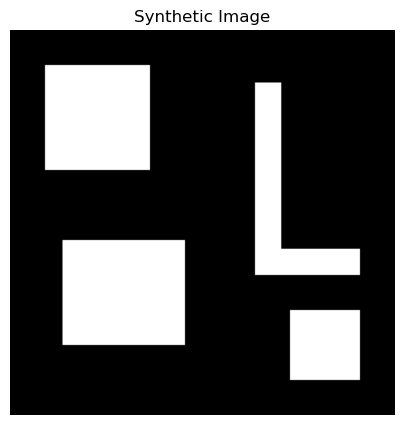

Parameters value: smoothing = 1.0, s_neightbor = 2.0, th = 1000000.0, density = 7


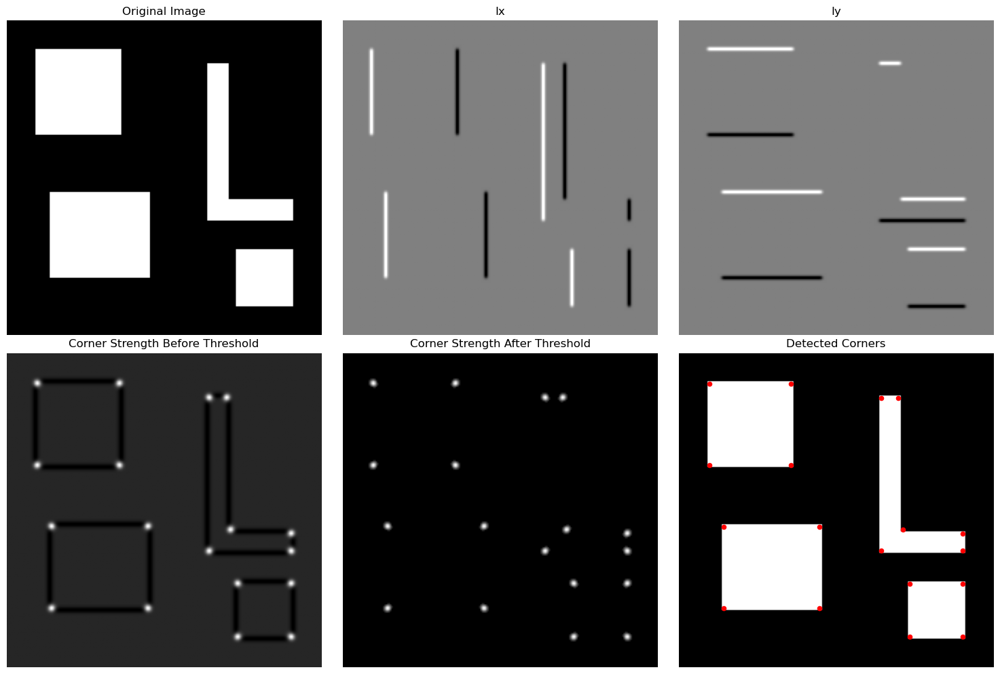

In [10]:
# Synthetic image generation
synthetic_im = np.zeros((220, 220), dtype=np.float64)

# Large square
synthetic_im[20:80, 20:80] = 255

# Rectangle
synthetic_im[120:180, 30:100] = 255

# L-shape
synthetic_im[30:140, 140:155] = 255
synthetic_im[125:140, 140:200] = 255

# Small square
synthetic_im[160:200, 160:200] = 255

plt.figure(figsize=(5, 5))
plt.imshow(synthetic_im, cmap="gray")
plt.title("Synthetic Image")
plt.axis("off")
plt.show()

synthetic_corners = harris_corner(synthetic_im, s_smooth=1.0,th=1e6, s_neighb=2.0, density_size=7, display=1)


### Corner detection tests on various images

#### Smoothing Sigma Parameter : s_sigma

##### Image 1: Superman

We will use this image to show the impact of the smoothing sigma (s_smooth) parameter on an image. When setting a bigger sigma, the image will be more blured before computer gradient (as we can see below) which gives us a detection that's more robust to noise but less sensitive to fine corners. 
Converely, a smaller sigma will gives us a noisier response. 
We can see this when comparing the cloud to the left of Superman as well as Superman emblem, the S. 

Bigger smoothing sigma
Parameters value: smoothing = 0.9, s_neightbor = 0.9, th = 50.0, density = 5


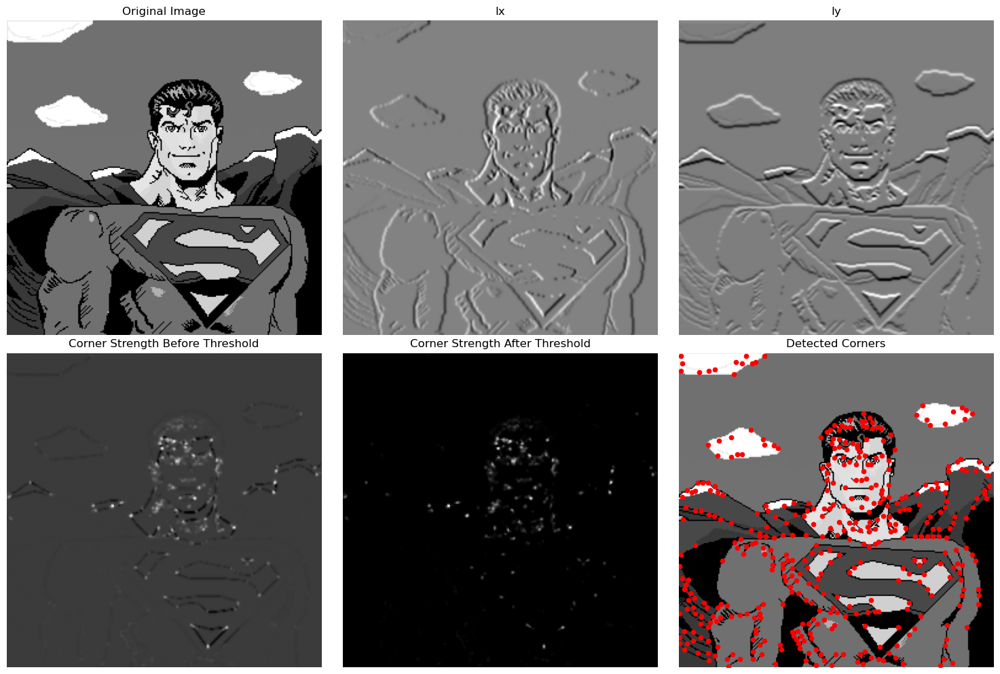

Smaller smoothing sigma
Parameters value: smoothing = 0.15, s_neightbor = 0.9, th = 50.0, density = 5


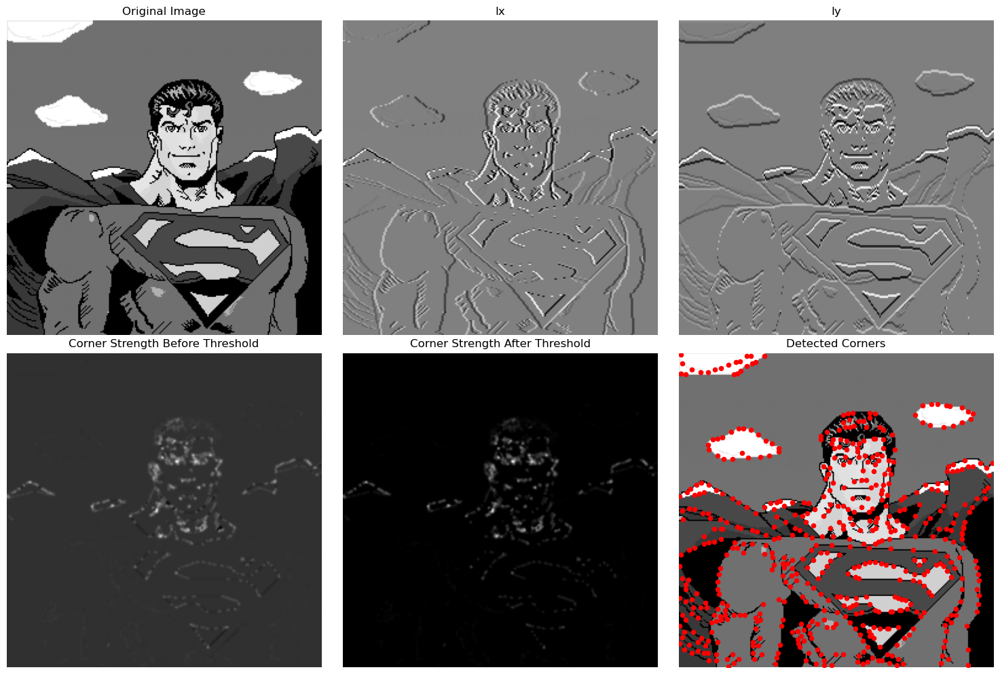

In [11]:
#Tests on other images
im3 = cv2.imread('Superman.png', cv2.IMREAD_GRAYSCALE)
print("Bigger smoothing sigma")
corners_view6, overlay_view6 = harris_corner(im3, s_smooth=0.9, s_neighb=0.9, th=50.0, density_size=5, display=1)

print("Smaller smoothing sigma")
corners_view6, overlay_view6 = harris_corner(im3, s_smooth=0.15, s_neighb=0.9, th=50.0, density_size=5, display=1)

##### Image 2: Hamlin, Hamlin & McGill building

Bigger smoothing sigma
Parameters value: smoothing = 1.2, s_neightbor = 1.0, th = 90.0, density = 5


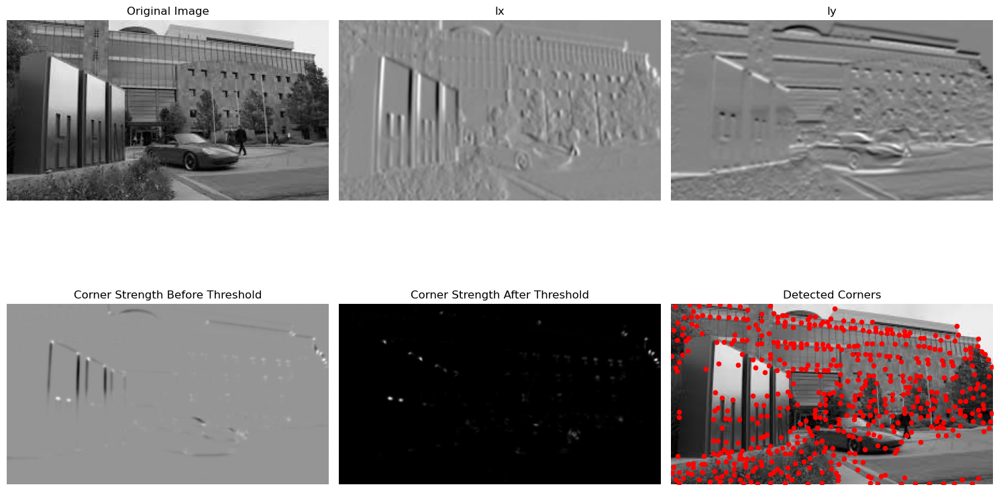

Smaller smoothing sigma
Parameters value: smoothing = 0.3, s_neightbor = 1.0, th = 90.0, density = 5


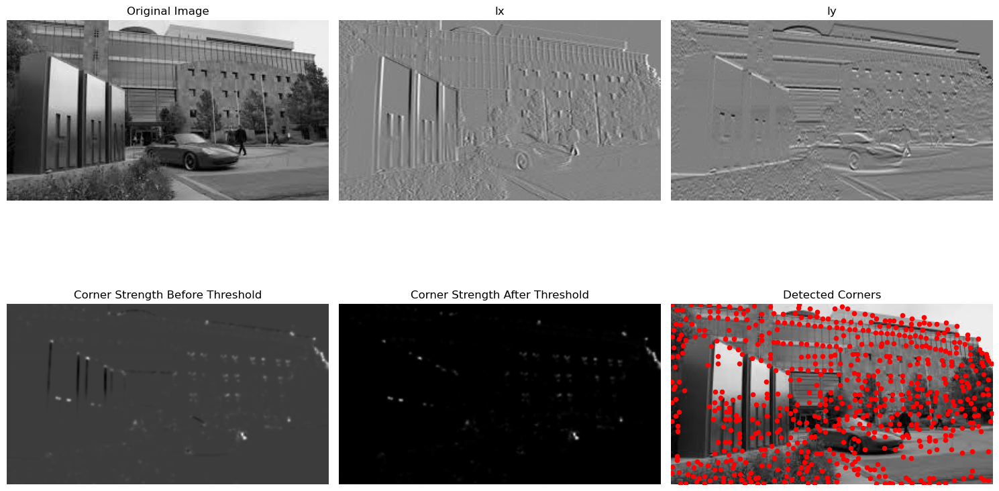

In [12]:
hhm = cv2.imread('hhm.jpg', cv2.IMREAD_GRAYSCALE)
print("Bigger smoothing sigma")
corners_g, overlay_g = harris_corner(hhm, s_smooth=1.2, s_neighb=1.0, th=90.0, density_size=5, display=1)
print("Smaller smoothing sigma")
corners_g, overlay_g = harris_corner(hhm, s_smooth=0.3, s_neighb=1.0, th=90.0, density_size=5, display=1)

#### Neighborhood Sigma Parameter: s_neighb

##### Image 1: SpongeBob

This images has a lot of details (relatively) and can help us understand the role of the Neighborhood Sigma (s_neighb). When choosing a bigger value we can see that it is more robust to noise and average the gradient product over a bigger neighborhood. In other words, it produces more stable corner responses but this can reduce the spatial precision. If the parameter value is too small we will get a more noisy result.

We can easily see by comparing the corner detected in the stars in the rainbow over Bob head and the corner detected in Bob's teeth. When s_neighb is smaller, the harris corner function  detect more corner over the stars and the teeth. When the s_neigh value is bigger, it instead blend all the corners of the stars into two centered points and it detect only 4 corners in each tooth of Bob (one in each corner of the tooth).

Smaller neighbor parameter
Parameters value: smoothing = 0.3, s_neightbor = 1.0, th = 100.0, density = 9


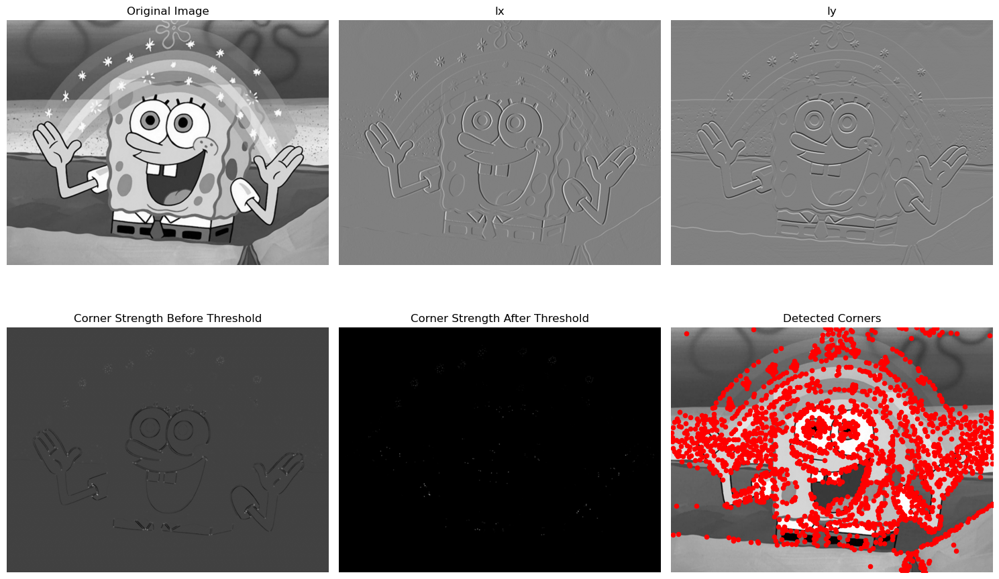

Bigger neighbor parameter
Parameters value: smoothing = 0.3, s_neightbor = 5.0, th = 100.0, density = 9


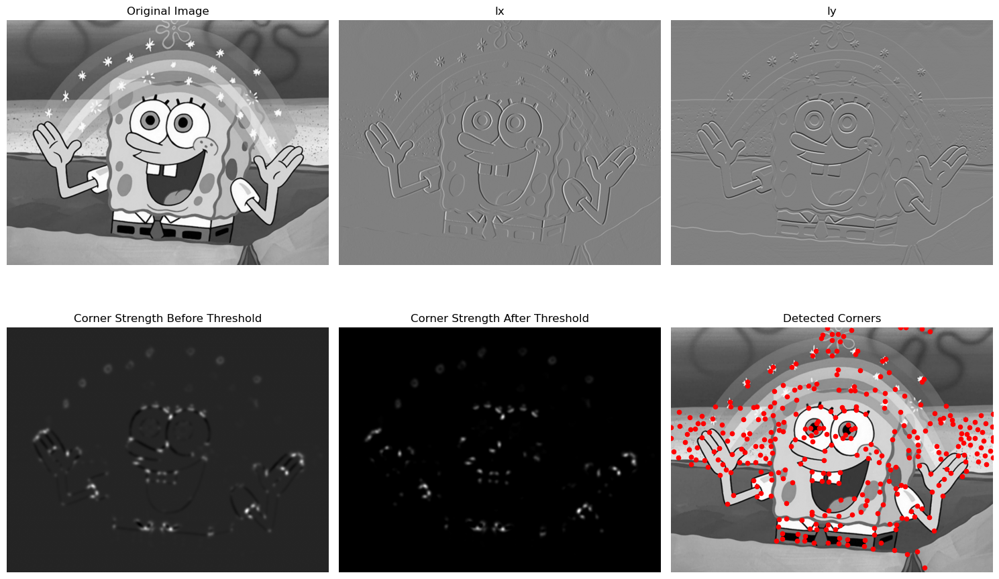

In [13]:
im4 = cv2.imread('SpongeBob.jpg', cv2.IMREAD_GRAYSCALE)

print("Smaller neighbor parameter")
corners_view6, overlay_view6 = harris_corner(im4, s_smooth=0.3, s_neighb=1.0, th=100.0, density_size=9, display=1)

print("Bigger neighbor parameter")
corners_view6, overlay_view6 = harris_corner(im4, s_smooth=0.3, s_neighb=5.0, th=100.0, density_size=9, display=1)

##### Image 2: Building

Smaller th value
Parameters value: smoothing = 1.2, s_neightbor = 0.3, th = 100.0, density = 40


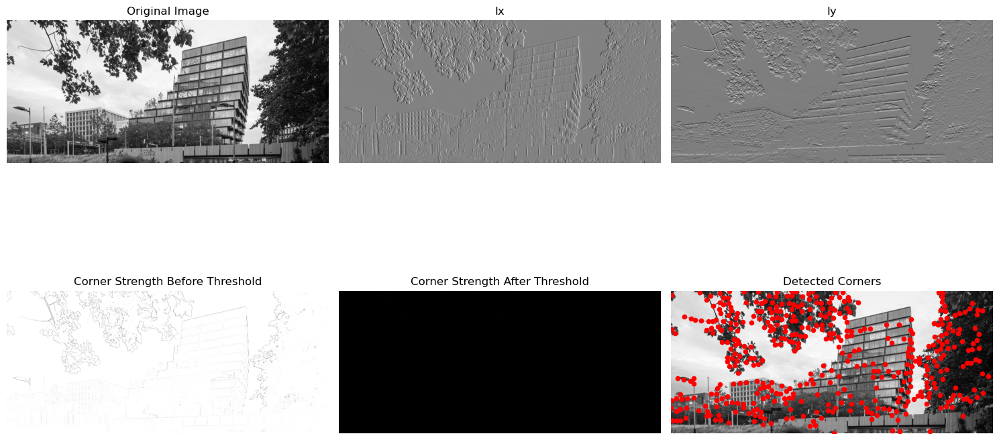

Bigger th value
Parameters value: smoothing = 1.1, s_neightbor = 1.2, th = 100.0, density = 40


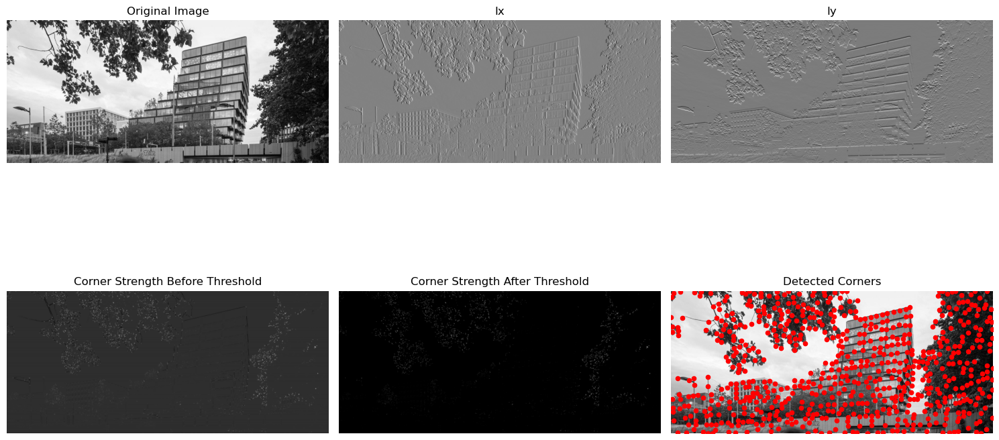

In [14]:
bb = cv2.imread('building.jpg', cv2.IMREAD_GRAYSCALE)
print("Smaller th value")
corners_view6, overlay_view6 = harris_corner(bb, s_smooth=1.2, s_neighb=0.3, th=100.0, density_size=40, display=1)

print("Bigger th value")
corners_view6, overlay_view6 = harris_corner(bb, s_smooth=1.1, s_neighb=1.2, th=100.0, density_size=40, display=1)

#### Threshold Parameter: th

##### Image 1: Harvey Specter's office (Suits)

The threshold parameter (th) is here to control which corner are kept. In the image below, we can see that for the same parameters (except th obviously), a smaller threshold will be keep more corner while an higher th value will only keep confident corner resulting in less corner "detected" in the image.

Smaller th value
Parameters value: smoothing = 0.9, s_neightbor = 0.9, th = 30.0, density = 40


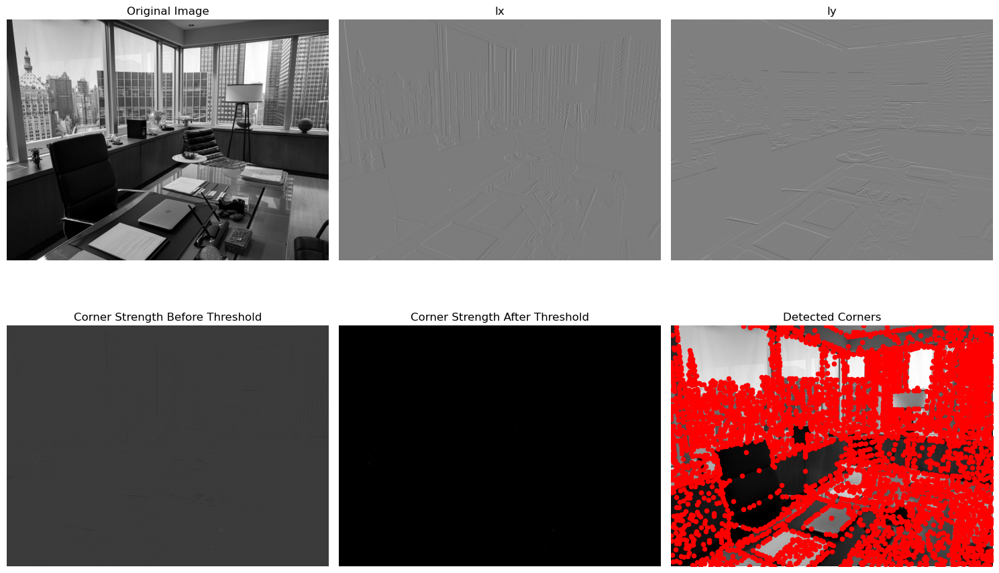

Bigger th value
Parameters value: smoothing = 0.9, s_neightbor = 0.9, th = 200.0, density = 40


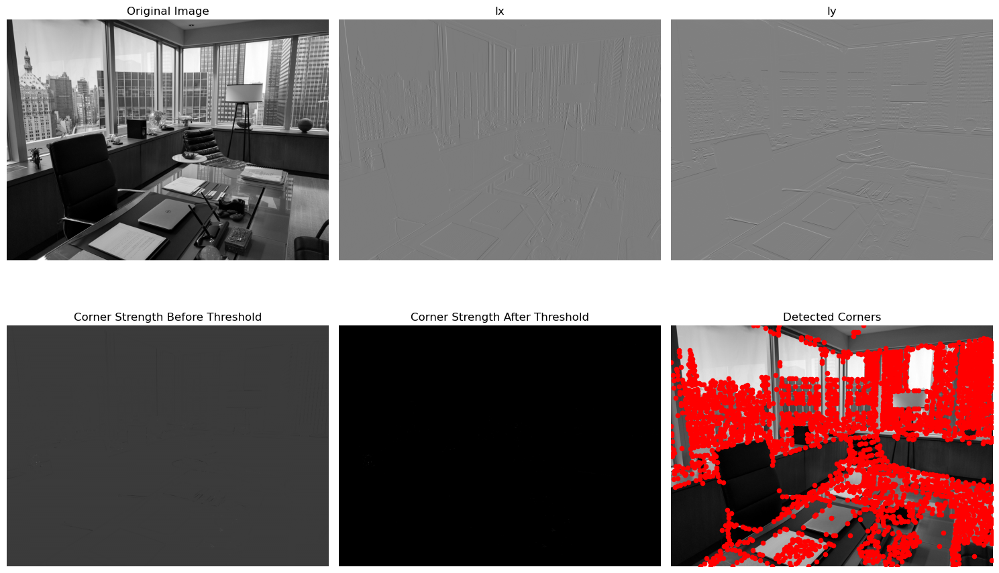

In [15]:
im5 = cv2.imread('Suits.jpg', cv2.IMREAD_GRAYSCALE)
print("Smaller th value")
corners_view6, overlay_view6 = harris_corner(im5, s_smooth=0.9, s_neighb=0.9, th=30.0, density_size=40, display=1)

print("Bigger th value")
corners_view6, overlay_view6 = harris_corner(im5, s_smooth=0.9, s_neighb=0.9, th=200.0, density_size=40, display=1)

##### Image 2: Go Board

By setting a high threshold value, we can see that the Harris corner detector returns fewer corners outside the game board. This is because only stronger corner responses are kept. As a result, the detector focuses more on the most prominent corners on the board itself rather than weaker corners in the surrounding area.

Smaller th value
Parameters value: smoothing = 1.0, s_neightbor = 0.9, th = 40.0, density = 12


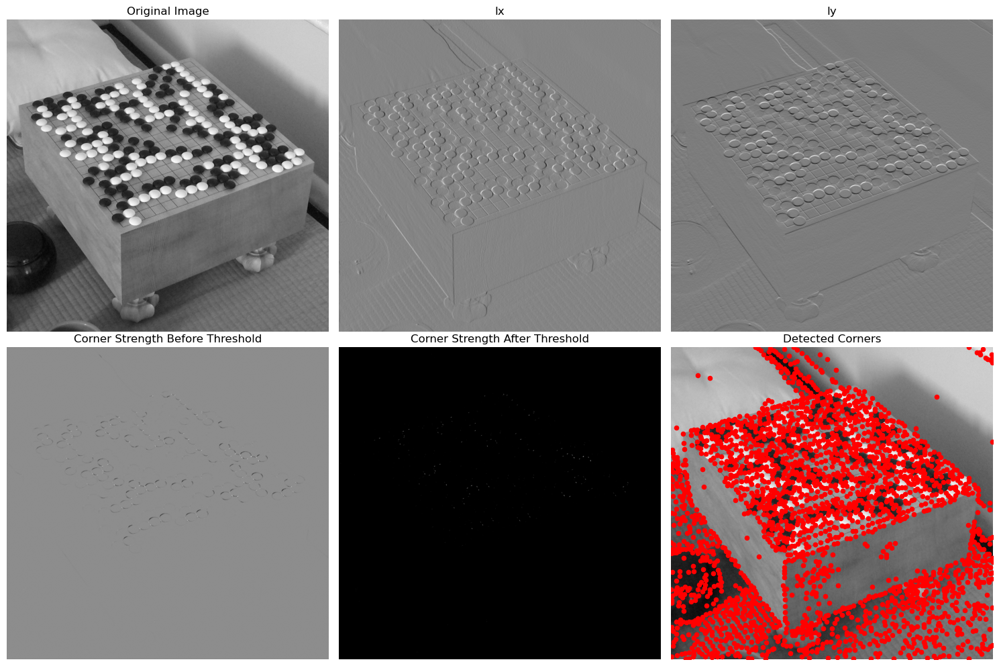

Bigger th value
Parameters value: smoothing = 1.0, s_neightbor = 0.9, th = 230.0, density = 12


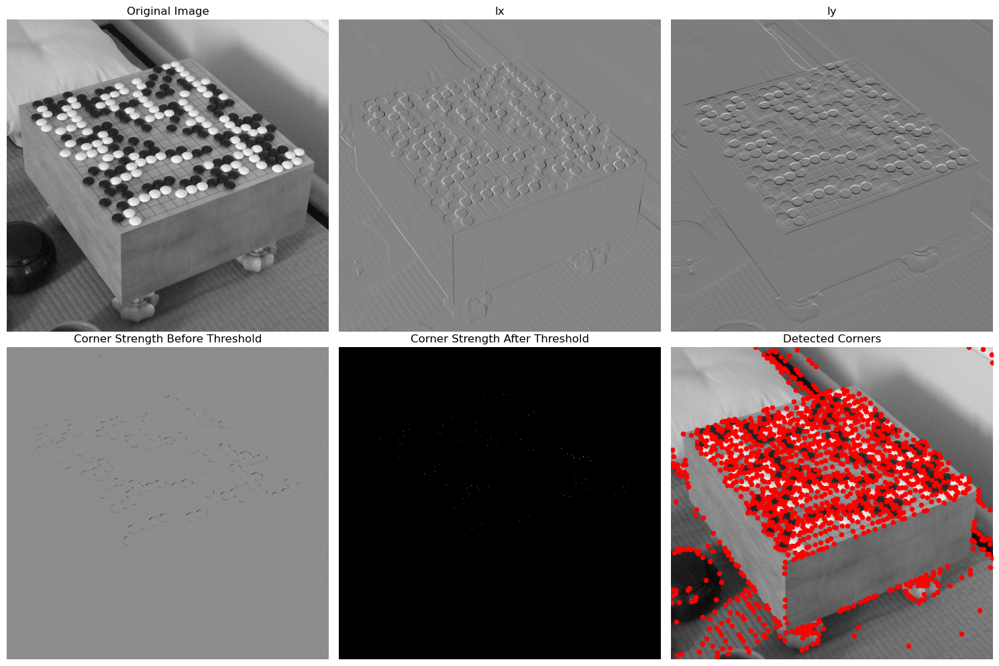

In [16]:
goBoard = cv2.imread('GoBoard.jpg', cv2.IMREAD_GRAYSCALE)
print("Smaller th value")
corners_view6, overlay_view6 = harris_corner(goBoard, s_smooth=1.0, s_neighb=0.9, th=40.0, density_size=12, display=1)

print("Bigger th value")
corners_view6, overlay_view6 = harris_corner(goBoard, s_smooth=1.0, s_neighb=0.9, th=230.0, density_size=12, display=1)

#### Density Parameter: density_size

##### Image 1: Flag of Israel

This image shows the impact of the density_size parameter on the corner detection in the small triangle inside the Maguen David. When setting a bigger value for the density_size parameter, the number of corner detected will decrease when there are a lot of corner that are close to one another. The difference is due to the fact that the density_size parameter is here to enforce the spacing between corners. When having a smaller density_size, it will detect multiple corner per corner. If the parameter is too large, it will only show the "strongest" corner detected in a region.

A bigger density size will result in fewer corner detected when these corner are very close
Parameters value: smoothing = 0.2, s_neightbor = 0.7, th = 40.0, density = 12


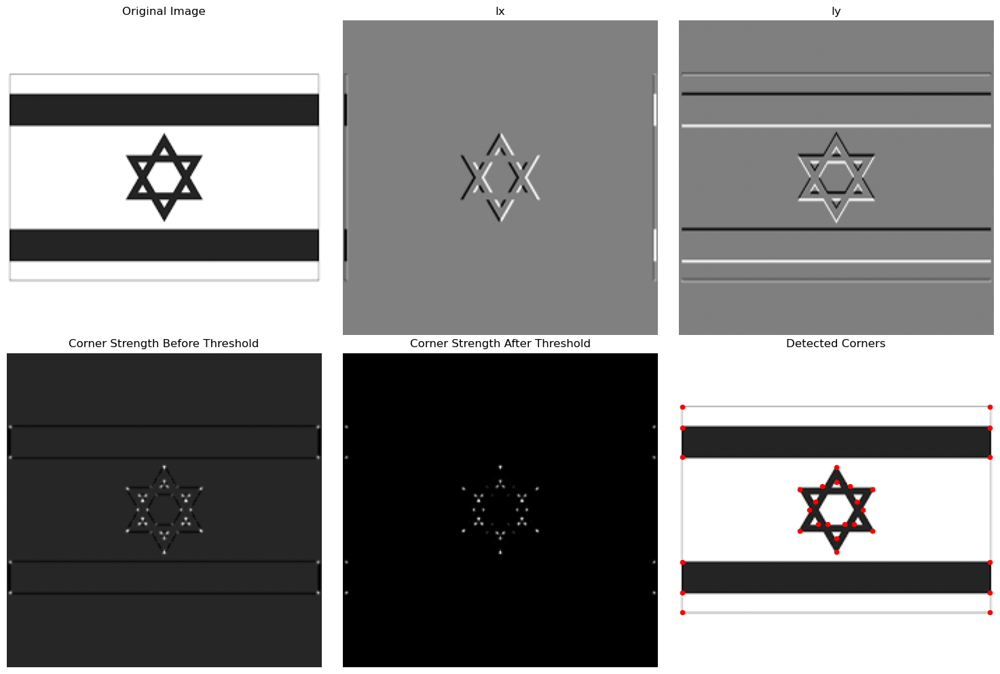

A smaller density size will result in more corner detected when these corner are very close
Parameters value: smoothing = 0.2, s_neightbor = 0.7, th = 40.0, density = 6


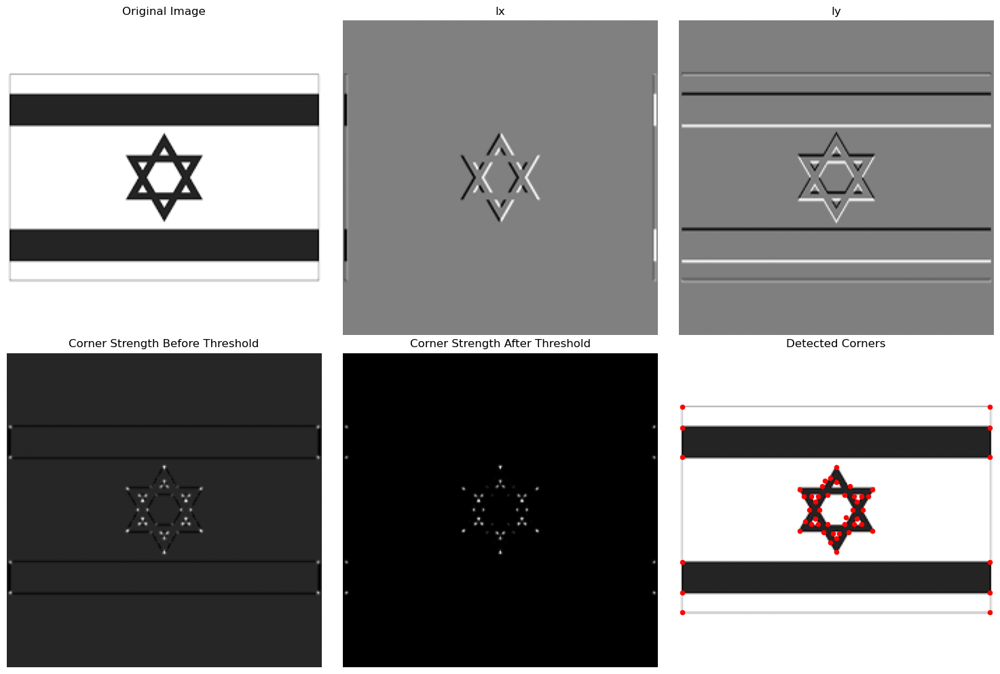

In [17]:
im6 = cv2.imread('IsraelFlag.png', cv2.IMREAD_GRAYSCALE)

print("A bigger density size will result in fewer corner detected when these corner are very close")
corners_view6, overlay_view6 = harris_corner(im6, s_smooth=0.2, s_neighb=0.7, th=40.0, density_size=12, display=1)

print("A smaller density size will result in more corner detected when these corner are very close")
corners_view6, overlay_view6 = harris_corner(im6, s_smooth=0.2, s_neighb=0.7, th=40.0, density_size=6, display=1)

##### Image 2: Western Wall

Since there a lot of corners in the Wester Wall (הכותל המערבי), setting a lower density size value results in an image full of red dots since the harris corner function detect a lot of corners which are all close to one another. By setting an higher density size parameter, it will enforce a bigger spacing between detected corners and reduce duplicates. 

Smaller th value
Parameters value: smoothing = 0.9, s_neightbor = 0.9, th = 100.0, density = 5


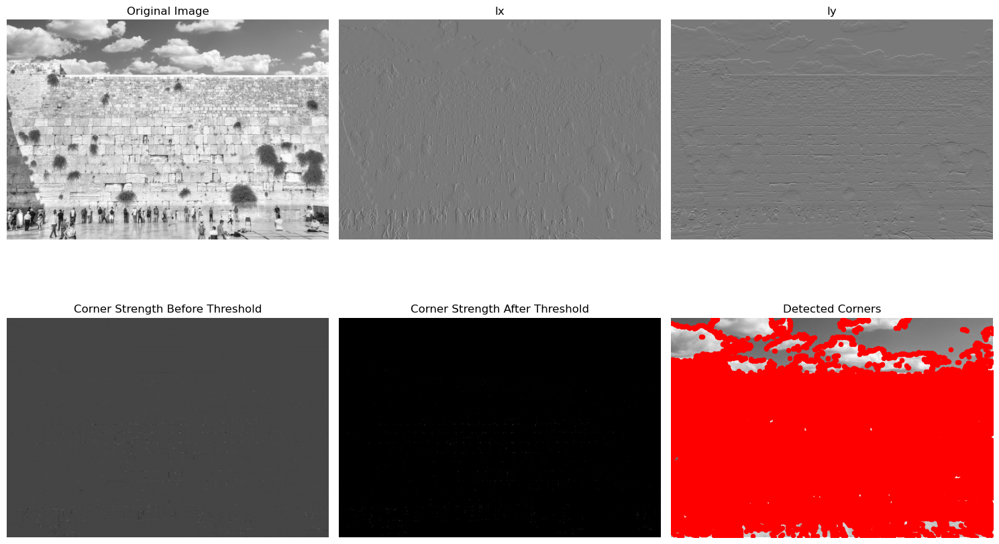

Bigger th value
Parameters value: smoothing = 0.9, s_neightbor = 0.9, th = 100.0, density = 50


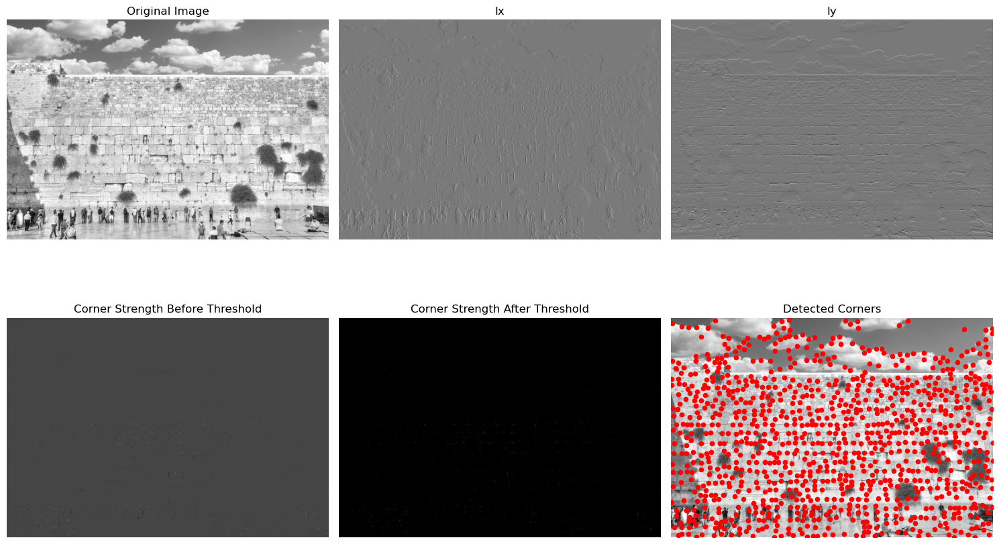

In [18]:
ww = cv2.imread('WWall.jpg', cv2.IMREAD_GRAYSCALE)
print("Smaller th value")
corners_view6, overlay_view6 = harris_corner(ww, s_smooth=0.9, s_neighb=0.9, th=100.0, density_size=5, display=1)

print("Bigger th value")
corners_view6, overlay_view6 = harris_corner(ww, s_smooth=0.9, s_neighb=0.9, th=100.0, density_size=50, display=1)

### Success and Failure on view6_crop.tif

The following test give us a (in my opinion) good representation of the corners in the image. We can see that compared to the test on image corner done in the next section, we have less corner detected on the paint in the back at the top right and only "relevant" corners are shown like the corner on the prism or on the scarf's square pattern.

Parameters value: smoothing = 1.1, s_neightbor = 1.3, th = 200.0, density = 6


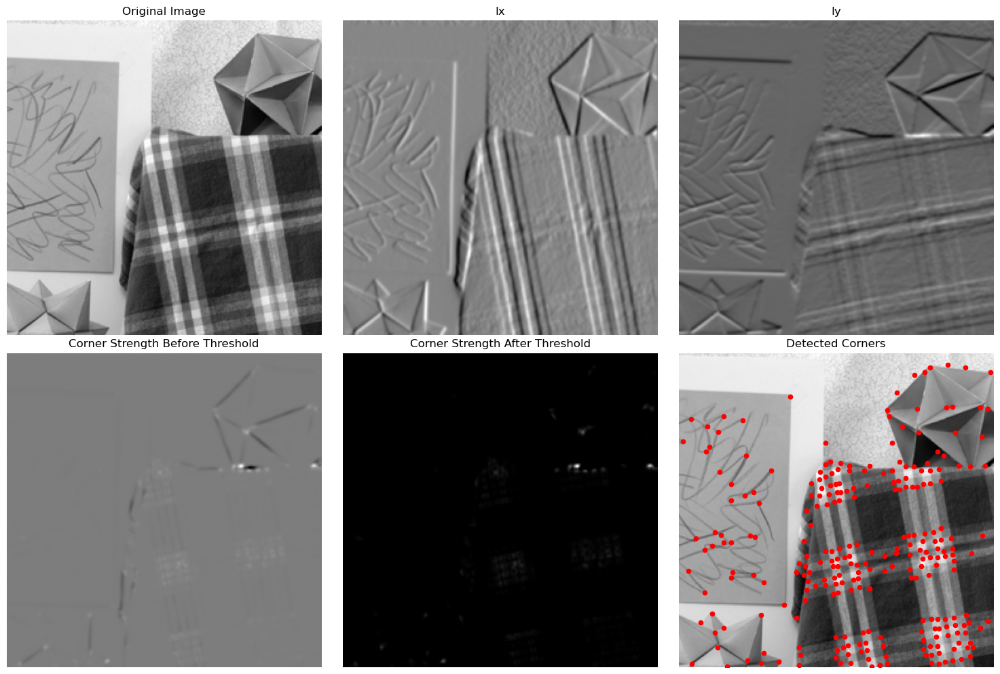

In [19]:
vc6_success = cv2.imread('view6_crop.tif', cv2.IMREAD_GRAYSCALE)
corn_view6_s, overl_view6_s = harris_corner(vc6_success, s_smooth=1.1, s_neighb=1.3, th=200.0, density_size=6, display=1)

On the other hand, the following test is a failure. Since the smoothing sigma and neighborhood sigma are too low, the harris corner cannot detect any corner even with a relatively low threshold. Even if the threshold is lowed to 1.0, the harris corner won't find any corner in the image. We can explain it since this combination of very low sigma make the estimations too local and unstable which in turn make it very hard to detect a corner.

Parameters value: smoothing = 0.2, s_neightbor = 0.2, th = 50.0, density = 6


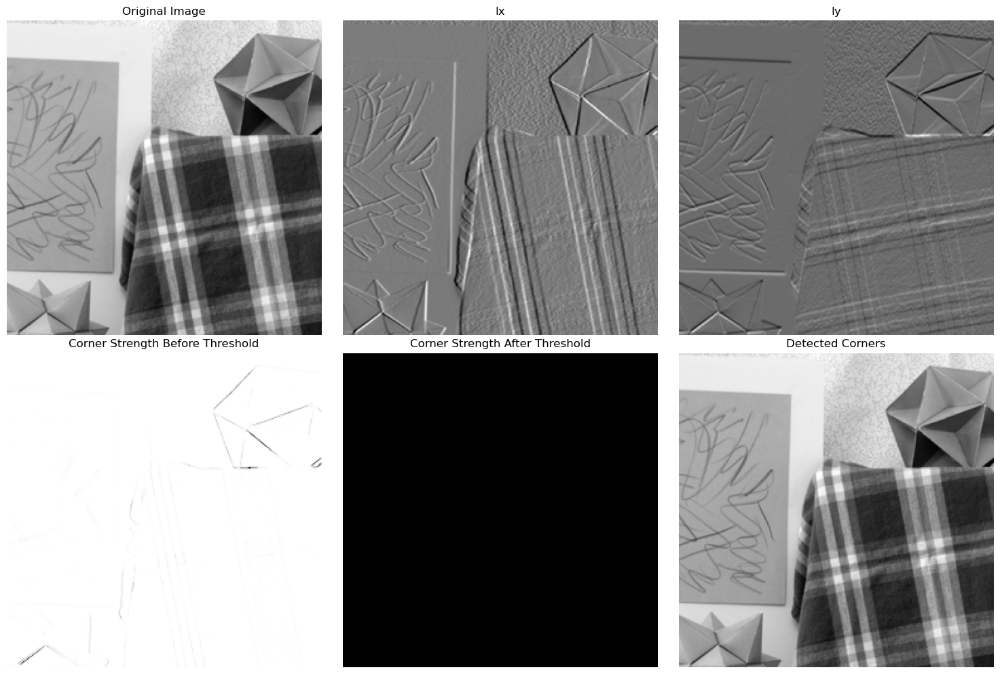

In [20]:
vc6_failure = cv2.imread('view6_crop.tif', cv2.IMREAD_GRAYSCALE)
corn_view6_f, overl_view6_f = harris_corner(vc6_failure, s_smooth=0.2, s_neighb=0.2, th=50.0, density_size=6, display=1)

### Summary of each parameters, hindsight, etc...

Parameters value: smoothing = 1.0, s_neightbor = 2.0, th = 0.01, density = 10


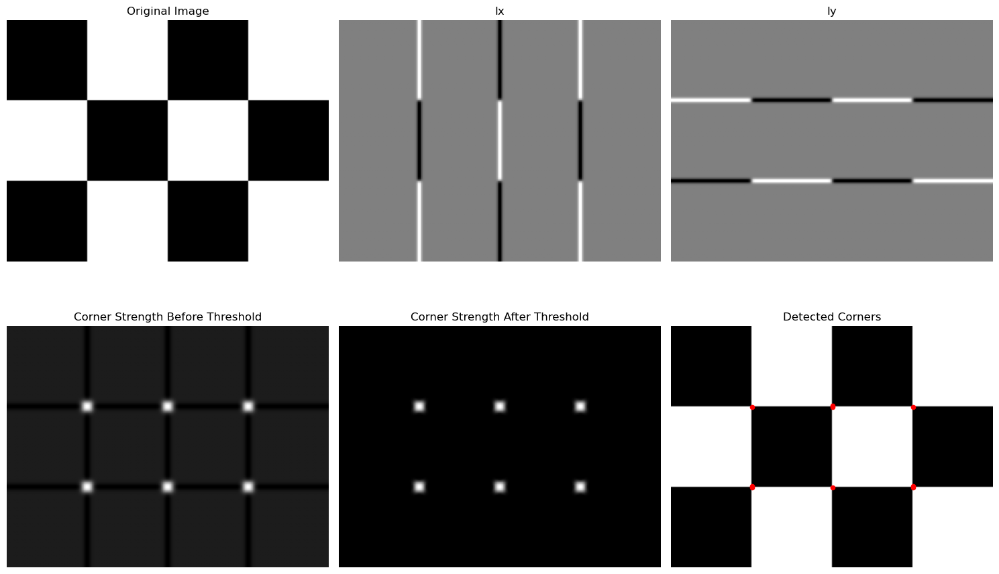

Parameters value: smoothing = 0.3, s_neightbor = 1.0, th = 100.0, density = 9


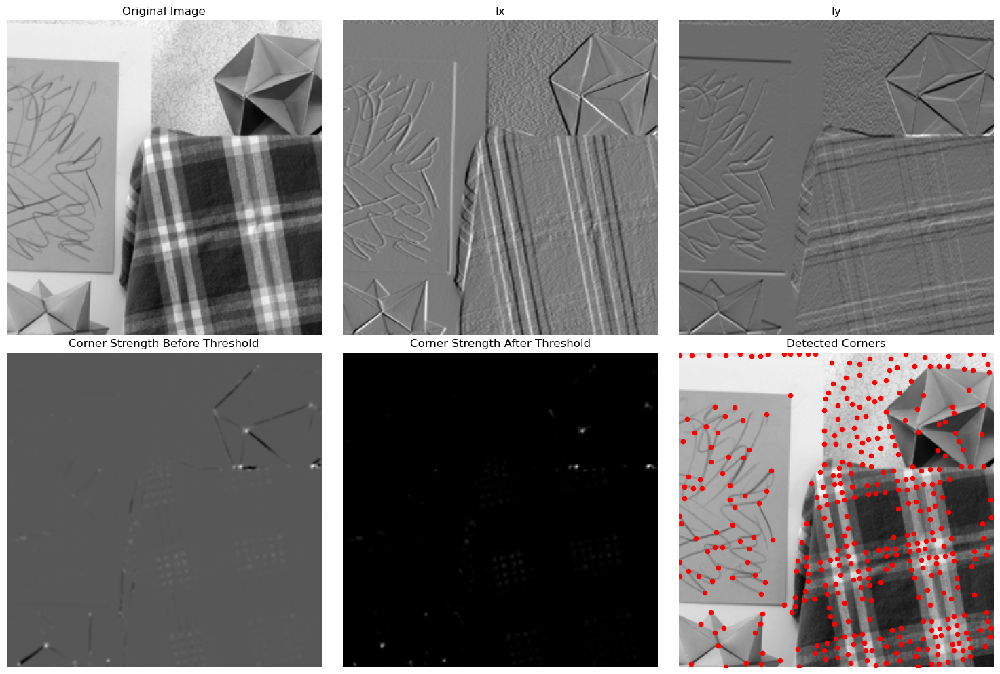

In [21]:
# Uncomments the following (and change parameters) to test. Don't forget to try various inputs and edge cases.

im = cv2.imread('perfect_checkerboard.png', cv2.IMREAD_GRAYSCALE)
corners = harris_corner(im, s_smooth=1.0, s_neighb=2.0, th=0.01, density_size=10, display=1)

im2 = cv2.imread('view6_crop.tif', cv2.IMREAD_GRAYSCALE)
corners_view6, overlay_view6 = harris_corner(im2, s_smooth=0.3, s_neighb=1.0, th=100.0, density_size=9, display=1)

# Answer variables for the final display cell:
param_effect_summary = "s_smooth is the parameter that make the detection more robust to noise but less sensitive to sharp corners. A too small value will result in a noisy response while a too large value will make the function miss corner" \
"s_neighb average the gradient product over the selected neighborhood. In other words, a bigger value will produce smoother and more stable corner responses but can reduce spatial precision and merge corners into one responses. "\
"The th parameter acts as a filter for corner strenghth. A high threshold keeps only stronger corners in which we are more confident while smaller values keep more corners."\
"The density_size parameter enforce the spacing between detected corners. An higher value while reduces duplicates but can sometimes only return the strongest corner in the region while a smaller value will have multiple detections per corner."

three_insights = ["The density size parameter, who controls non maximum suprresion, is maybe the most important parameter since without it a single strong corner could possibly generate a cluster of detected corners instead of a single one. ", 
                  "The choice of parameters significantly affects the detection results, any small chages can have a big impact on the quality and number of corners detected", 
                  "The detector responds strongly when we have a change of intensity in x and y simultaneously, which is why edges a usually rejected (depending of course on the params value) and corner preserved"]

non_trivial_part = "The trickiest part was to implement the harris corner function and have a better understanding of every steps / part of it. The other challenging part was to understand how each parameters affect the image but the tests done on multiples images helped a lot to understand this."

## Final Variables to Display

To keep submission simple, define these variables in your notebook code:

- `mask1`, `mask2`, `mask3`, `mask4`
- `corners_view6`
- `overlay_view6` (image array with displayed/marked corners)
- `param_effect_summary` (short text)
- `three_insights` (list of 3 strings)
- `non_trivial_part` (short text)

The final display cell reads these variables directly.


## Final Results Display

This section displays all final outputs directly in the notebook for quick manual review.


Section A - Masks
mask1: shape=(5, 5), dtype=float64
[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]
mask2: shape=(5, 5), dtype=int64
[[ 1  1  1  1  1]
 [ 1 -1  1  1  1]
 [ 1 -1 -1 -1  1]
 [ 1 -1 -1  1  1]
 [ 1  1  1  1  1]]
mask3: shape=(5, 5), dtype=int64
[[ -1  -1  -1  -1  -1]
 [ -1   0   1   0  -1]
 [  0   1   1   1   1]
 [ -1   0 255  -1  -1]
 [ -1  -1  -1  -1  -1]]
mask4: shape=(7, 7), dtype=float64
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]

Section B - Corner Outputs
corners_view6: shape=(2, 388), dtype=int64
[[  0   0   0   0   0   0   0   0   0   0   1   1   1   1   2   2   2   3
    4   4   7   7   8   8  10  10  10  10  11  12  13  13  15  17  19  21
   22  23  24  27  29  31  31  33  33  35  35  35  36  38  40  41  41  42
   42  42  43  44  45  46  47  48  5

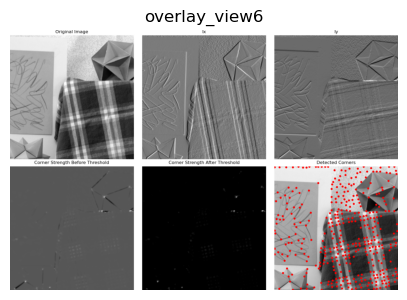


Section B2 - Text Answers
param_effect_summary: s_smooth is the parameter that make the detection more robust to noise but less sensitive to sharp corners. A too small value will result in a noisy response while a too large value will make the function miss corners_neighb average the gradient product over the selected neighborhood. In other words, a bigger value will produce smoother and more stable corner responses but can reduce spatial precision and merge corners into one responses. The th parameter acts as a filter for corner strenghth. A high threshold keeps only stronger corners in which we are more confident while smaller values keep more corners.The density_size parameter enforce the spacing between detected corners. An higher value while reduces duplicates but can sometimes only return the strongest corner in the region while a smaller value will have multiple detections per corner.
three_insights: ['The density size parameter, who controls non maximum suprresion, is maybe th

In [22]:
def show_array(name, value):
    if value is None:
        print(f"{name}: MISSING")
        return
    arr = np.asarray(value)
    print(f"{name}: shape={arr.shape}, dtype={arr.dtype}")
    print(arr)


def show_text(name, value):
    if value is None:
        print(f"{name}: MISSING")
    else:
        print(f"{name}: {value}")


print("=" * 60)
print("Section A - Masks")
print("=" * 60)
show_array("mask1", globals().get("mask1", None))
show_array("mask2", globals().get("mask2", None))
show_array("mask3", globals().get("mask3", None))
show_array("mask4", globals().get("mask4", None))

print("\n" + "=" * 60)
print("Section B - Corner Outputs")
print("=" * 60)
show_array("corners_view6", globals().get("corners_view6", None))

overlay = globals().get("overlay_view6", None)
if overlay is not None:
    arr = np.asarray(overlay)
    plt.figure(figsize=(5, 5))
    if arr.ndim == 2:
        plt.imshow(arr, cmap="gray")
    else:
        plt.imshow(arr)
    plt.title("overlay_view6")
    plt.axis("off")
    plt.show()
else:
    print("overlay_view6: MISSING")

print("\n" + "=" * 60)
print("Section B2 - Text Answers")
print("=" * 60)
show_text("param_effect_summary", globals().get("param_effect_summary", None))
show_text("three_insights", globals().get("three_insights", None))
show_text("non_trivial_part", globals().get("non_trivial_part", None))
